In [1]:
!pip install pandas-profiling

  Attempting uninstall: scipy
    Found existing installation: scipy 1.5.0
    Uninstalling scipy-1.5.0:
      Successfully uninstalled scipy-1.5.0


In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import os

In [3]:
import pandas_profiling

In [4]:
df = pd.read_csv("D:\My Downloads\FitBit data.csv")

In [5]:
df.head()

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories
0,1503960366,3/25/2016,11004,7.11,7.11,0.0,2.57,0.46,4.07,0.0,33,12,205,804,1819
1,1503960366,3/26/2016,17609,11.55,11.55,0.0,6.92,0.73,3.91,0.0,89,17,274,588,2154
2,1503960366,3/27/2016,12736,8.53,8.53,0.0,4.66,0.16,3.71,0.0,56,5,268,605,1944
3,1503960366,3/28/2016,13231,8.93,8.93,0.0,3.19,0.79,4.95,0.0,39,20,224,1080,1932
4,1503960366,3/29/2016,12041,7.85,7.85,0.0,2.16,1.09,4.61,0.0,28,28,243,763,1886


When we have any dataset , first we need to understand the dataset, what is it about. what is the relatioship between the columns, what is the target variable. what we need to predict etc. get data business understanding

Here we are trying to predict calor

df.profile_report gives a very beautiful report about the dataset.
by using this we can avoide other set of code to get the details

1. Here in this dataset we are not seeing any duplicate records. if we find any duplicate rows then we may need to remove them

2. If there are any columns with zero values (Total step variable), then we may need to handle those zero values based on our analysis or need

3.


In [6]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

so we get so much above info with single line of code

In [7]:
# To see the shape of the dataset

df.shape

(457, 15)

In [8]:
# five number summary 

df.describe()

,Id,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories
count,4.570000e+02,457.000000,457.000000,457.000000,457.000000,457.000000,457.000000,457.000000,457.000000,457.000000,457.000000,457.000000,457.000000,457.000000
mean,4.628595e+09,6546.562363,4.663523,4.609847,0.179427,1.180897,0.478643,2.890197,0.001904,16.623632,13.070022,170.070022,995.282276,2189.452954
std,2.293781e+09,5398.493064,4.082072,4.068540,0.849232,2.487159,0.830995,2.237523,0.008487,28.919704,36.208635,122.205372,337.021404,815.484523
min,1.503960e+09,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000
25%,2.347168e+09,1988.000000,1.410000,1.280000,0.000000,0.000000,0.000000,0.870000,0.000000,0.000000,0.000000,64.000000,728.000000,1776.000000
50%,4.057193e+09,5986.000000,4.090000,4.090000,0.000000,0.000000,0.020000,2.930000,0.000000,0.000000,1.000000,181.000000,1057.000000,2062.000000
75%,6.391747e+09,10198.000000,7.160000,7.110000,0.000000,1.310000,0.670000,4.460000,0.000000,25.000000,16.000000,257.000000,1285.000000,2667.000000
max,8.877689e+09,28497.000000,27.530001,27.530001,6.727057,21.920000,6.400000,12.510000,0.100000,202.000000,660.000000,720.000000,1440.000000,4562.000000


In [9]:
df.head()

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories
0,1503960366,3/25/2016,11004,7.11,7.11,0.0,2.57,0.46,4.07,0.0,33,12,205,804,1819
1,1503960366,3/26/2016,17609,11.55,11.55,0.0,6.92,0.73,3.91,0.0,89,17,274,588,2154
2,1503960366,3/27/2016,12736,8.53,8.53,0.0,4.66,0.16,3.71,0.0,56,5,268,605,1944
3,1503960366,3/28/2016,13231,8.93,8.93,0.0,3.19,0.79,4.95,0.0,39,20,224,1080,1932
4,1503960366,3/29/2016,12041,7.85,7.85,0.0,2.16,1.09,4.61,0.0,28,28,243,763,1886


In [10]:
# check if there are any nulls

df.isnull().sum()

Id                          0
ActivityDate                0
TotalSteps                  0
TotalDistance               0
TrackerDistance             0
LoggedActivitiesDistance    0
VeryActiveDistance          0
ModeratelyActiveDistance    0
LightActiveDistance         0
SedentaryActiveDistance     0
VeryActiveMinutes           0
FairlyActiveMinutes         0
LightlyActiveMinutes        0
SedentaryMinutes            0
Calories                    0
dtype: int64

In [11]:

# first find the columns in the df

df.columns

Index(['Id', 'ActivityDate', 'TotalSteps', 'TotalDistance', 'TrackerDistance',
       'LoggedActivitiesDistance', 'VeryActiveDistance',
       'ModeratelyActiveDistance', 'LightActiveDistance',
       'SedentaryActiveDistance', 'VeryActiveMinutes', 'FairlyActiveMinutes',
       'LightlyActiveMinutes', 'SedentaryMinutes', 'Calories'],
      dtype='object')

In [12]:
# Check the type of all the columns

df.dtypes



Id                            int64
ActivityDate                 object
TotalSteps                    int64
TotalDistance               float64
TrackerDistance             float64
LoggedActivitiesDistance    float64
VeryActiveDistance          float64
ModeratelyActiveDistance    float64
LightActiveDistance         float64
SedentaryActiveDistance     float64
VeryActiveMinutes             int64
FairlyActiveMinutes           int64
LightlyActiveMinutes          int64
SedentaryMinutes              int64
Calories                      int64
dtype: object

 WE can see that ActivityDate is a categorical column. If we want to see
unique values in the column

In [14]:
df["ActivityDate"].unique()

array(['3/25/2016', '3/26/2016', '3/27/2016', '3/28/2016', '3/29/2016',
       '3/30/2016', '3/31/2016', '4/1/2016', '4/2/2016', '4/3/2016',
       '4/4/2016', '4/5/2016', '4/6/2016', '4/7/2016', '4/8/2016',
       '4/9/2016', '4/10/2016', '4/11/2016', '4/12/2016', '3/12/2016',
       '3/13/2016', '3/14/2016', '3/15/2016', '3/16/2016', '3/17/2016',
       '3/18/2016', '3/19/2016', '3/20/2016', '3/21/2016', '3/22/2016',
       '3/23/2016', '3/24/2016'], dtype=object)

In [ ]:
# lets try to separeate Activitydate into date/year/month as a new column

In [15]:
df['date'] =  pd.DatetimeIndex(df['ActivityDate'])

In [16]:
df # we can date column is created and having only date part from ActivityDate 

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories,date
0,1503960366,3/25/2016,11004,7.110000,7.110000,0.0,2.57,0.46,4.07,0.00,33,12,205,804,1819,2016-03-25
1,1503960366,3/26/2016,17609,11.550000,11.550000,0.0,6.92,0.73,3.91,0.00,89,17,274,588,2154,2016-03-26
2,1503960366,3/27/2016,12736,8.530000,8.530000,0.0,4.66,0.16,3.71,0.00,56,5,268,605,1944,2016-03-27
3,1503960366,3/28/2016,13231,8.930000,8.930000,0.0,3.19,0.79,4.95,0.00,39,20,224,1080,1932,2016-03-28
4,1503960366,3/29/2016,12041,7.850000,7.850000,0.0,2.16,1.09,4.61,0.00,28,28,243,763,1886,2016-03-29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
452,8877689391,4/8/2016,23014,20.389999,20.389999,0.0,11.10,0.63,8.62,0.00,70,29,359,982,4196,2016-04-08
453,8877689391,4/9/2016,16470,8.070000,8.070000,0.0,0.00,0.02,8.02,0.00,90,9,289,1052,3841,2016-04-09
454,8877689391,4/10/2016,28497,27.530001,27.530001,0.0,21.92,1.12,4.46,0.00,128,46,211,1055,4526,2016-04-10
455,8877689391,4/11/2016,10622,8.060000,8.060000,0.0,1.47,0.15,6.37,0.01,18,7,225,1190,2820,2016-04-11


In [17]:
# check the datatype of new column.
# we can see that date column is having a datetime64 type.  so now I 
# will be able to perform any date kind of opearions

df.dtypes

Id                                   int64
ActivityDate                        object
TotalSteps                           int64
TotalDistance                      float64
TrackerDistance                    float64
LoggedActivitiesDistance           float64
VeryActiveDistance                 float64
ModeratelyActiveDistance           float64
LightActiveDistance                float64
SedentaryActiveDistance            float64
VeryActiveMinutes                    int64
FairlyActiveMinutes                  int64
LightlyActiveMinutes                 int64
SedentaryMinutes                     int64
Calories                             int64
date                        datetime64[ns]
dtype: object

In [ ]:
# DatetimeIndex is trying to Transform the categorical data into a 
# datetime data. SO now datatype has changed, now I cas perform any kind of 
# datetime opearations

In [ ]:
# lets create a another column which will store only day from datepart

In [18]:
df['day'] = pd.DatetimeIndex(df['ActivityDate']).day

In [19]:
df  # we can see day column is holding only day part for date

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories,date,day
0,1503960366,3/25/2016,11004,7.110000,7.110000,0.0,2.57,0.46,4.07,0.00,33,12,205,804,1819,2016-03-25,25
1,1503960366,3/26/2016,17609,11.550000,11.550000,0.0,6.92,0.73,3.91,0.00,89,17,274,588,2154,2016-03-26,26
2,1503960366,3/27/2016,12736,8.530000,8.530000,0.0,4.66,0.16,3.71,0.00,56,5,268,605,1944,2016-03-27,27
3,1503960366,3/28/2016,13231,8.930000,8.930000,0.0,3.19,0.79,4.95,0.00,39,20,224,1080,1932,2016-03-28,28
4,1503960366,3/29/2016,12041,7.850000,7.850000,0.0,2.16,1.09,4.61,0.00,28,28,243,763,1886,2016-03-29,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
452,8877689391,4/8/2016,23014,20.389999,20.389999,0.0,11.10,0.63,8.62,0.00,70,29,359,982,4196,2016-04-08,8
453,8877689391,4/9/2016,16470,8.070000,8.070000,0.0,0.00,0.02,8.02,0.00,90,9,289,1052,3841,2016-04-09,9
454,8877689391,4/10/2016,28497,27.530001,27.530001,0.0,21.92,1.12,4.46,0.00,128,46,211,1055,4526,2016-04-10,10
455,8877689391,4/11/2016,10622,8.060000,8.060000,0.0,1.47,0.15,6.37,0.01,18,7,225,1190,2820,2016-04-11,11


In [20]:
df['year'] = pd.DatetimeIndex(df['ActivityDate']).year

In [21]:
df

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories,date,day,year
0,1503960366,3/25/2016,11004,7.110000,7.110000,0.0,2.57,0.46,4.07,0.00,33,12,205,804,1819,2016-03-25,25,2016
1,1503960366,3/26/2016,17609,11.550000,11.550000,0.0,6.92,0.73,3.91,0.00,89,17,274,588,2154,2016-03-26,26,2016
2,1503960366,3/27/2016,12736,8.530000,8.530000,0.0,4.66,0.16,3.71,0.00,56,5,268,605,1944,2016-03-27,27,2016
3,1503960366,3/28/2016,13231,8.930000,8.930000,0.0,3.19,0.79,4.95,0.00,39,20,224,1080,1932,2016-03-28,28,2016
4,1503960366,3/29/2016,12041,7.850000,7.850000,0.0,2.16,1.09,4.61,0.00,28,28,243,763,1886,2016-03-29,29,2016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
452,8877689391,4/8/2016,23014,20.389999,20.389999,0.0,11.10,0.63,8.62,0.00,70,29,359,982,4196,2016-04-08,8,2016
453,8877689391,4/9/2016,16470,8.070000,8.070000,0.0,0.00,0.02,8.02,0.00,90,9,289,1052,3841,2016-04-09,9,2016
454,8877689391,4/10/2016,28497,27.530001,27.530001,0.0,21.92,1.12,4.46,0.00,128,46,211,1055,4526,2016-04-10,10,2016
455,8877689391,4/11/2016,10622,8.060000,8.060000,0.0,1.47,0.15,6.37,0.01,18,7,225,1190,2820,2016-04-11,11,2016


In [ ]:
# to store only month from ActivityDate column

In [22]:
df['months'] = pd.DatetimeIndex(df['ActivityDate']).month

In [23]:
df

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories,date,day,year,months
0,1503960366,3/25/2016,11004,7.110000,7.110000,0.0,2.57,0.46,4.07,0.00,33,12,205,804,1819,2016-03-25,25,2016,3
1,1503960366,3/26/2016,17609,11.550000,11.550000,0.0,6.92,0.73,3.91,0.00,89,17,274,588,2154,2016-03-26,26,2016,3
2,1503960366,3/27/2016,12736,8.530000,8.530000,0.0,4.66,0.16,3.71,0.00,56,5,268,605,1944,2016-03-27,27,2016,3
3,1503960366,3/28/2016,13231,8.930000,8.930000,0.0,3.19,0.79,4.95,0.00,39,20,224,1080,1932,2016-03-28,28,2016,3
4,1503960366,3/29/2016,12041,7.850000,7.850000,0.0,2.16,1.09,4.61,0.00,28,28,243,763,1886,2016-03-29,29,2016,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
452,8877689391,4/8/2016,23014,20.389999,20.389999,0.0,11.10,0.63,8.62,0.00,70,29,359,982,4196,2016-04-08,8,2016,4
453,8877689391,4/9/2016,16470,8.070000,8.070000,0.0,0.00,0.02,8.02,0.00,90,9,289,1052,3841,2016-04-09,9,2016,4
454,8877689391,4/10/2016,28497,27.530001,27.530001,0.0,21.92,1.12,4.46,0.00,128,46,211,1055,4526,2016-04-10,10,2016,4
455,8877689391,4/11/2016,10622,8.060000,8.060000,0.0,1.47,0.15,6.37,0.01,18,7,225,1190,2820,2016-04-11,11,2016,4


In [24]:
# just extract only newly added columns

In [29]:
df[['ActivityDate','day' , 'months' , 'year']]

,ActivityDate,day,months,year
0,3/25/2016,25,3,2016
1,3/26/2016,26,3,2016
2,3/27/2016,27,3,2016
3,3/28/2016,28,3,2016
4,3/29/2016,29,3,2016
...,...,...,...,...
452,4/8/2016,8,4,2016
453,4/9/2016,9,4,2016
454,4/10/2016,10,4,2016
455,4/11/2016,11,4,2016


In [30]:
# Drop a column from the dataset. Drop will not drop the column from the dataset

df.drop(['ActivityDate'], axis=1)

,Id,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories,date,day,year,months
0,1503960366,11004,7.110000,7.110000,0.0,2.57,0.46,4.07,0.00,33,12,205,804,1819,2016-03-25,25,2016,3
1,1503960366,17609,11.550000,11.550000,0.0,6.92,0.73,3.91,0.00,89,17,274,588,2154,2016-03-26,26,2016,3
2,1503960366,12736,8.530000,8.530000,0.0,4.66,0.16,3.71,0.00,56,5,268,605,1944,2016-03-27,27,2016,3
3,1503960366,13231,8.930000,8.930000,0.0,3.19,0.79,4.95,0.00,39,20,224,1080,1932,2016-03-28,28,2016,3
4,1503960366,12041,7.850000,7.850000,0.0,2.16,1.09,4.61,0.00,28,28,243,763,1886,2016-03-29,29,2016,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
452,8877689391,23014,20.389999,20.389999,0.0,11.10,0.63,8.62,0.00,70,29,359,982,4196,2016-04-08,8,2016,4
453,8877689391,16470,8.070000,8.070000,0.0,0.00,0.02,8.02,0.00,90,9,289,1052,3841,2016-04-09,9,2016,4
454,8877689391,28497,27.530001,27.530001,0.0,21.92,1.12,4.46,0.00,128,46,211,1055,4526,2016-04-10,10,2016,4
455,8877689391,10622,8.060000,8.060000,0.0,1.47,0.15,6.37,0.01,18,7,225,1190,2820,2016-04-11,11,2016,4


In [31]:
df  # we still see AcctivityDate in the Dataset

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories,date,day,year,months
0,1503960366,3/25/2016,11004,7.110000,7.110000,0.0,2.57,0.46,4.07,0.00,33,12,205,804,1819,2016-03-25,25,2016,3
1,1503960366,3/26/2016,17609,11.550000,11.550000,0.0,6.92,0.73,3.91,0.00,89,17,274,588,2154,2016-03-26,26,2016,3
2,1503960366,3/27/2016,12736,8.530000,8.530000,0.0,4.66,0.16,3.71,0.00,56,5,268,605,1944,2016-03-27,27,2016,3
3,1503960366,3/28/2016,13231,8.930000,8.930000,0.0,3.19,0.79,4.95,0.00,39,20,224,1080,1932,2016-03-28,28,2016,3
4,1503960366,3/29/2016,12041,7.850000,7.850000,0.0,2.16,1.09,4.61,0.00,28,28,243,763,1886,2016-03-29,29,2016,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
452,8877689391,4/8/2016,23014,20.389999,20.389999,0.0,11.10,0.63,8.62,0.00,70,29,359,982,4196,2016-04-08,8,2016,4
453,8877689391,4/9/2016,16470,8.070000,8.070000,0.0,0.00,0.02,8.02,0.00,90,9,289,1052,3841,2016-04-09,9,2016,4
454,8877689391,4/10/2016,28497,27.530001,27.530001,0.0,21.92,1.12,4.46,0.00,128,46,211,1055,4526,2016-04-10,10,2016,4
455,8877689391,4/11/2016,10622,8.060000,8.060000,0.0,1.47,0.15,6.37,0.01,18,7,225,1190,2820,2016-04-11,11,2016,4


In [ ]:
# to drop the ActivityDate column from df, then we need to use inplace=True.

# In general first we copy the file into an9ther dataset, then derom the rows

In [ ]:
# grpahps

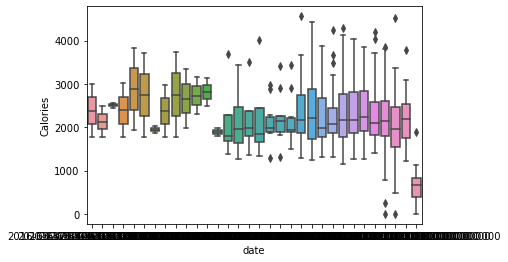

In [33]:
import matplotlib.pyplot as plt
sns.boxplot(x = 'date' , y = 'Calories' , data=df)

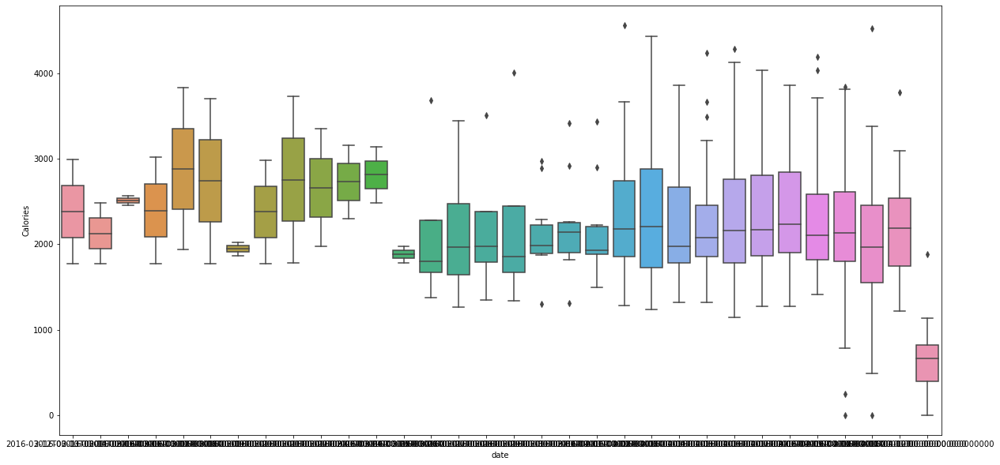

In [34]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20,10))  # increase the graph size
sns.boxplot(x = 'date' , y = 'Calories' , data=df)

In [48]:
# lets get the week info for Activitydate

df['week'] = pd.DatetimeIndex(df['ActivityDate']).week

In [49]:
df

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,...,SedentaryMinutes,Calories,date,day,year,months,week,week_name,date_time,day_name
0,1503960366,3/25/2016,11004,7.110000,7.110000,0.0,2.57,0.46,4.07,0.00,...,804,1819,2016-03-25,25,2016,3,12,<bound method PandasDelegate._add_delegate_acc...,2016-03-25,Friday
1,1503960366,3/26/2016,17609,11.550000,11.550000,0.0,6.92,0.73,3.91,0.00,...,588,2154,2016-03-26,26,2016,3,12,<bound method PandasDelegate._add_delegate_acc...,2016-03-26,Saturday
2,1503960366,3/27/2016,12736,8.530000,8.530000,0.0,4.66,0.16,3.71,0.00,...,605,1944,2016-03-27,27,2016,3,12,<bound method PandasDelegate._add_delegate_acc...,2016-03-27,Sunday
3,1503960366,3/28/2016,13231,8.930000,8.930000,0.0,3.19,0.79,4.95,0.00,...,1080,1932,2016-03-28,28,2016,3,13,<bound method PandasDelegate._add_delegate_acc...,2016-03-28,Monday
4,1503960366,3/29/2016,12041,7.850000,7.850000,0.0,2.16,1.09,4.61,0.00,...,763,1886,2016-03-29,29,2016,3,13,<bound method PandasDelegate._add_delegate_acc...,2016-03-29,Tuesday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
452,8877689391,4/8/2016,23014,20.389999,20.389999,0.0,11.10,0.63,8.62,0.00,...,982,4196,2016-04-08,8,2016,4,14,<bound method PandasDelegate._add_delegate_acc...,2016-04-08,Friday
453,8877689391,4/9/2016,16470,8.070000,8.070000,0.0,0.00,0.02,8.02,0.00,...,1052,3841,2016-04-09,9,2016,4,14,<bound method PandasDelegate._add_delegate_acc...,2016-04-09,Saturday
454,8877689391,4/10/2016,28497,27.530001,27.530001,0.0,21.92,1.12,4.46,0.00,...,1055,4526,2016-04-10,10,2016,4,14,<bound method PandasDelegate._add_delegate_acc...,2016-04-10,Sunday
455,8877689391,4/11/2016,10622,8.060000,8.060000,0.0,1.47,0.15,6.37,0.01,...,1190,2820,2016-04-11,11,2016,4,15,<bound method PandasDelegate._add_delegate_acc...,2016-04-11,Monday


In [37]:
# print the week name

In [50]:
df['date_time'] = pd.to_datetime(df['ActivityDate'])

In [51]:
pd.to_datetime(df['ActivityDate'])

0     2016-03-25
1     2016-03-26
2     2016-03-27
3     2016-03-28
4     2016-03-29
         ...    
452   2016-04-08
453   2016-04-09
454   2016-04-10
455   2016-04-11
456   2016-04-12
Name: ActivityDate, Length: 457, dtype: datetime64[ns]

In [52]:
df['date_time'].dt.day_name()

0        Friday
1      Saturday
2        Sunday
3        Monday
4       Tuesday
         ...   
452      Friday
453    Saturday
454      Sunday
455      Monday
456     Tuesday
Name: date_time, Length: 457, dtype: object

In [53]:
df['day_name'] = df['date_time'].dt.day_name()

In [54]:
df

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,...,SedentaryMinutes,Calories,date,day,year,months,week,week_name,date_time,day_name
0,1503960366,3/25/2016,11004,7.110000,7.110000,0.0,2.57,0.46,4.07,0.00,...,804,1819,2016-03-25,25,2016,3,12,<bound method PandasDelegate._add_delegate_acc...,2016-03-25,Friday
1,1503960366,3/26/2016,17609,11.550000,11.550000,0.0,6.92,0.73,3.91,0.00,...,588,2154,2016-03-26,26,2016,3,12,<bound method PandasDelegate._add_delegate_acc...,2016-03-26,Saturday
2,1503960366,3/27/2016,12736,8.530000,8.530000,0.0,4.66,0.16,3.71,0.00,...,605,1944,2016-03-27,27,2016,3,12,<bound method PandasDelegate._add_delegate_acc...,2016-03-27,Sunday
3,1503960366,3/28/2016,13231,8.930000,8.930000,0.0,3.19,0.79,4.95,0.00,...,1080,1932,2016-03-28,28,2016,3,13,<bound method PandasDelegate._add_delegate_acc...,2016-03-28,Monday
4,1503960366,3/29/2016,12041,7.850000,7.850000,0.0,2.16,1.09,4.61,0.00,...,763,1886,2016-03-29,29,2016,3,13,<bound method PandasDelegate._add_delegate_acc...,2016-03-29,Tuesday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
452,8877689391,4/8/2016,23014,20.389999,20.389999,0.0,11.10,0.63,8.62,0.00,...,982,4196,2016-04-08,8,2016,4,14,<bound method PandasDelegate._add_delegate_acc...,2016-04-08,Friday
453,8877689391,4/9/2016,16470,8.070000,8.070000,0.0,0.00,0.02,8.02,0.00,...,1052,3841,2016-04-09,9,2016,4,14,<bound method PandasDelegate._add_delegate_acc...,2016-04-09,Saturday
454,8877689391,4/10/2016,28497,27.530001,27.530001,0.0,21.92,1.12,4.46,0.00,...,1055,4526,2016-04-10,10,2016,4,14,<bound method PandasDelegate._add_delegate_acc...,2016-04-10,Sunday
455,8877689391,4/11/2016,10622,8.060000,8.060000,0.0,1.47,0.15,6.37,0.01,...,1190,2820,2016-04-11,11,2016,4,15,<bound method PandasDelegate._add_delegate_acc...,2016-04-11,Monday


In [55]:
df.drop(['week_name'], axis=1)

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,...,LightlyActiveMinutes,SedentaryMinutes,Calories,date,day,year,months,week,date_time,day_name
0,1503960366,3/25/2016,11004,7.110000,7.110000,0.0,2.57,0.46,4.07,0.00,...,205,804,1819,2016-03-25,25,2016,3,12,2016-03-25,Friday
1,1503960366,3/26/2016,17609,11.550000,11.550000,0.0,6.92,0.73,3.91,0.00,...,274,588,2154,2016-03-26,26,2016,3,12,2016-03-26,Saturday
2,1503960366,3/27/2016,12736,8.530000,8.530000,0.0,4.66,0.16,3.71,0.00,...,268,605,1944,2016-03-27,27,2016,3,12,2016-03-27,Sunday
3,1503960366,3/28/2016,13231,8.930000,8.930000,0.0,3.19,0.79,4.95,0.00,...,224,1080,1932,2016-03-28,28,2016,3,13,2016-03-28,Monday
4,1503960366,3/29/2016,12041,7.850000,7.850000,0.0,2.16,1.09,4.61,0.00,...,243,763,1886,2016-03-29,29,2016,3,13,2016-03-29,Tuesday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
452,8877689391,4/8/2016,23014,20.389999,20.389999,0.0,11.10,0.63,8.62,0.00,...,359,982,4196,2016-04-08,8,2016,4,14,2016-04-08,Friday
453,8877689391,4/9/2016,16470,8.070000,8.070000,0.0,0.00,0.02,8.02,0.00,...,289,1052,3841,2016-04-09,9,2016,4,14,2016-04-09,Saturday
454,8877689391,4/10/2016,28497,27.530001,27.530001,0.0,21.92,1.12,4.46,0.00,...,211,1055,4526,2016-04-10,10,2016,4,14,2016-04-10,Sunday
455,8877689391,4/11/2016,10622,8.060000,8.060000,0.0,1.47,0.15,6.37,0.01,...,225,1190,2820,2016-04-11,11,2016,4,15,2016-04-11,Monday


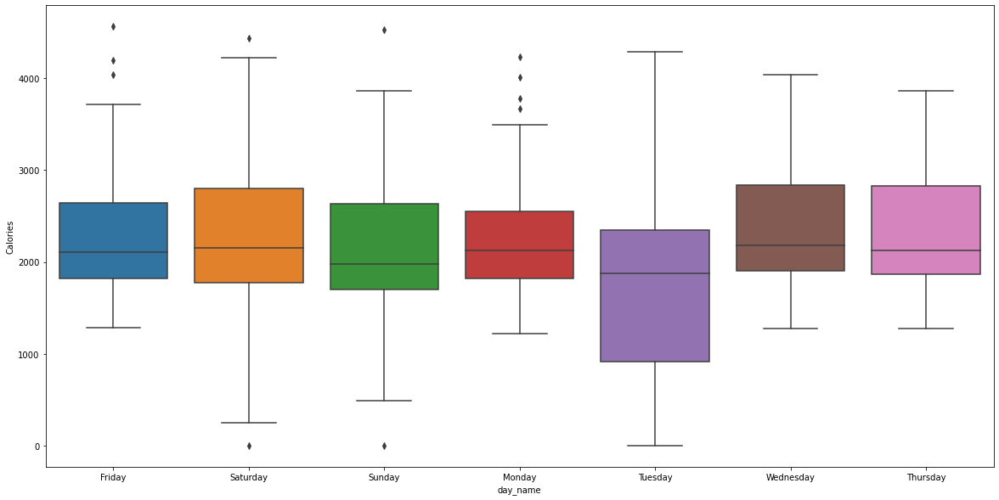

In [56]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20,10))
sns.boxplot(x = 'day_name' , y = 'Calories' , data =df)

In [ ]:
# calories vs Totalstpes reatlionship via scatterplot

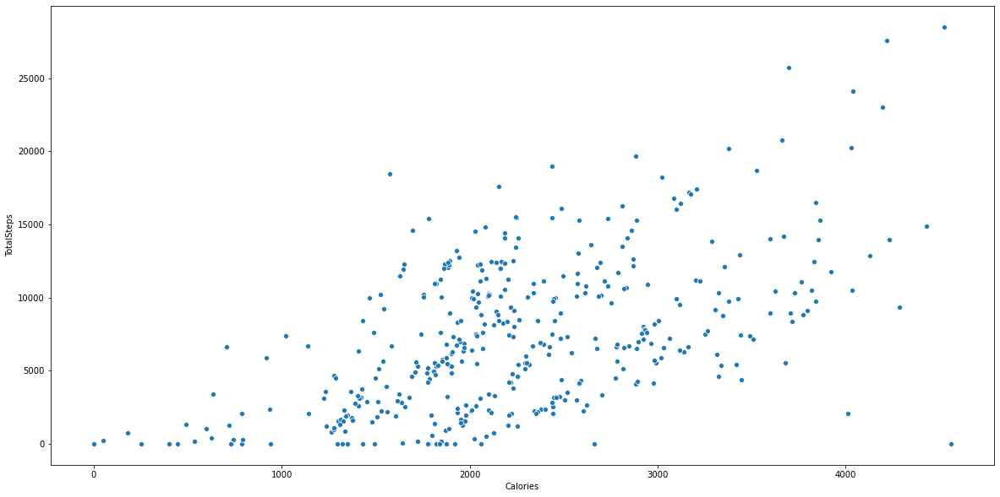

In [60]:
plt.figure(figsize=(20,10))
sns.scatterplot(x =  'Calories' , y = 'TotalSteps' , data =df)


In [ ]:
https://github.com/iNeuronai/EDACollection